In [3]:
import sympy
from sympy import symbols, integrate, simplify, pprint
from sympy.physics.quantum import TensorProduct 
import symnum
import symnum.numpy as snp 
import matplotlib.pyplot as plt
import numpy as np
import jax.numpy as jnp
from jax.scipy.linalg import cho_solve
from jax.scipy.special import ndtr, ndtri
from jax import jit, vmap, grad, value_and_grad
from jax.lax import scan
from jax.example_libraries.optimizers import adagrad, adam
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib import cm
from jax.config import config
import time
import csv 
import pandas as pd 
import simsde.operators as operators
import densityexpansion.modifiedldl as DEmldl
import densityexpansion.ldl as DEldl
config.update('jax_enable_x64', True)
config.update('jax_platform_name', 'cpu')

Definition of FHN model

In [4]:
dim_x = 2
dim_r = 1
dim_w = 1
dim_θ = 4

def drift_func_rough(x, θ):
    ε, γ, β, *_= θ
    return snp.array([
        γ*x[1] - x[0] + β
        ]) 

def drift_func_smooth(x, θ):
    ε, *_= θ
    s = 0.01
    return snp.array([
        (x[1] - x[1]**3 - x[0] - s) / ε
        ])

def diff_coeff_rough(x, θ):
    ε, γ, β, σ = θ
    return snp.array([[σ]])

def drift_func(x, θ):
    return snp.concatenate((drift_func_rough(x, θ), drift_func_smooth(x, θ)))

def diff_coeff(x, θ):
    return snp.concatenate((diff_coeff_rough(x, θ), snp.zeros((dim_x - dim_r, dim_w))), 0)


One step transition density schemes

In [5]:
# dict of symbolic expression of transition densities 
symbolic_density_expansions_ldl = {
    'LDL': DEldl.LL_transition_density,
    'DE-J-3': DEldl.Density_expansion_J_3,
    'DE-J-4': DEldl.Density_expansion_J_4,
    'DE-J-5': DEldl.Density_expansion_J_5, 
}

# transforming symbolic expression into jax numpy format 
jax_density_expansions_ldl = {
    key: symnum.numpify(dim_x, dim_x, dim_θ, None, numpy_module=jnp)(
        symbolic_density_expansion(
            drift_func
        )
    )
    for key, symbolic_density_expansion in 
    symbolic_density_expansions_ldl.items()
}

In [6]:
# dict of symbolic expression of transition densities 
symbolic_density_expansions_mldl ={
    'modified-LDL': DEmldl.LL_transition_density,
    'DE-J-3': DEmldl.Density_expansion_J_3,
    'DE-J-4': DEmldl.Density_expansion_J_4,
    'DE-J-5': DEmldl.Density_expansion_J_5, 
}

# transforming symbolic expression into jax numpy format 
jax_density_expansions_mldl = {
    key: symnum.numpify(dim_x, dim_x, dim_θ, None, numpy_module=jnp)(
        symbolic_density_expansion(
            drift_func
        )
    )
    for key, symbolic_density_expansion in 
    symbolic_density_expansions_mldl.items()
}

In [7]:
smooth_grid_size = 51

def Modified_LDL_grids(grids, x_0, θ, inner_step):
    def density_vector(y, x_0, θ, inner_step):
        return vmap(jax_density_expansions_mldl['modified-LDL'], (0, None, None, None))(y, x_0, θ, inner_step)
    
    return jnp.array([density_vector(grids[i,:], x_0, θ, inner_step) for i in range(smooth_grid_size)])

def Density_expansion_J_3_grids_mldl(grids, x_0, θ, inner_step):
    def log_density_vector(y, x_0, θ, inner_step):
        return vmap(jax_density_expansions_mldl['DE-J-3'], (0, None, None, None))(y, x_0, θ, inner_step)
    
    return jnp.array([log_density_vector(grids[i,:], x_0, θ, inner_step) for i in range(smooth_grid_size)]) 

def Density_expansion_J_4_grids_mldl(grids, x_0, θ, inner_step):
    def log_density_vector(y, x_0, θ, inner_step):
        return vmap(jax_density_expansions_mldl['DE-J-4'], (0, None, None, None))(y, x_0, θ, inner_step)
    
    return jnp.array([log_density_vector(grids[i,:], x_0, θ, inner_step) for i in range(smooth_grid_size)])  

def Density_expansion_J_5_grids_mldl(grids, x_0, θ, inner_step):
    def log_density_vector(y, x_0, θ, inner_step):
        return vmap(jax_density_expansions_mldl['DE-J-5'], (0, None, None, None))(y, x_0, θ, inner_step)
    
    return jnp.array([log_density_vector(grids[i,:], x_0, θ, inner_step) for i in range(smooth_grid_size)]) 

Density_expansion_grids_generators_mldl={
    'modified-LDL': Modified_LDL_grids,
    'DE-J-3': Density_expansion_J_3_grids_mldl,
    'DE-J-4': Density_expansion_J_4_grids_mldl,
    'DE-J-5': Density_expansion_J_5_grids_mldl,
}

In [8]:
def LDL_grids(grids, x_0, θ, inner_step):
    def density_vector(y, x_0, θ, inner_step):
        return vmap(jax_density_expansions_ldl['LDL'], (0, None, None, None))(y, x_0, θ, inner_step)
    
    return jnp.array([density_vector(grids[i,:], x_0, θ, inner_step) for i in range(smooth_grid_size)])

def Density_expansion_J_3_grids_ldl(grids, x_0, θ, inner_step):
    def log_density_vector(y, x_0, θ, inner_step):
        return vmap(jax_density_expansions_ldl['DE-J-3'], (0, None, None, None))(y, x_0, θ, inner_step)
    
    return jnp.array([log_density_vector(grids[i,:], x_0, θ, inner_step) for i in range(smooth_grid_size)]) 

def Density_expansion_J_4_grids_ldl(grids, x_0, θ, inner_step):
    def log_density_vector(y, x_0, θ, inner_step):
        return vmap(jax_density_expansions_ldl['DE-J-4'], (0, None, None, None))(y, x_0, θ, inner_step)
    
    return jnp.array([log_density_vector(grids[i,:], x_0, θ, inner_step) for i in range(smooth_grid_size)])  

def Density_expansion_J_5_grids_ldl(grids, x_0, θ, inner_step):
    def log_density_vector(y, x_0, θ, inner_step):
        return vmap(jax_density_expansions_ldl['DE-J-5'], (0, None, None, None))(y, x_0, θ, inner_step)
    
    return jnp.array([log_density_vector(grids[i,:], x_0, θ, inner_step) for i in range(smooth_grid_size)]) 

Density_expansion_grids_generators_ldl={
    'LDL': LDL_grids,
    'DE-J-3': Density_expansion_J_3_grids_ldl,
    'DE-J-4': Density_expansion_J_4_grids_ldl,
    'DE-J-5': Density_expansion_J_5_grids_ldl,
}

In [9]:
L1_err_DE_LDL = {
    '0.1': [],
    '0.05': [],
    '0.02': [],
}

L1_err_DE_mLDL = {
    '0.1': [],
    '0.05': [],
    '0.02': [],
}

est_grids_ldl = {
    '0.1': [],
    '0.05': [],
    '0.02': [],
}

est_grids_mldl = {
    '0.1': [],
    '0.05': [],
    '0.02': [],
}

s_range = {
    '0.1': (-1.2, 0.0),
    '0.05': (-0.5, -0.1),
    '0.02': (-0.22, -0.12),   
}

r_range = {
    '0.1': (-1.0, 1.0),
    '0.05': (-0.4, 0.8),
    '0.02': (-0.15, 0.55),   
}

benchmark_path = {
    '0.1' : "/Users/yugaiguchi/Research/Numerical study/Python/CF expansion/numerical_experiments/Density-expansion/Original-FHN/Density expansion/Data/Benchmark/FHN-KDE-set2-T=0.1-dt=0.000125-start=[ 0.2 -0.1]-MCpaths=20000000.csv",
    '0.05' : "/Users/yugaiguchi/Research/Numerical study/Python/CF expansion/numerical_experiments/Density-expansion/Original-FHN/Density expansion/Data/Benchmark/FHN-KDE-set2-T=0.05-dt=6.25e-05-start=[ 0.2 -0.1]-MCpaths=20000000.csv", 
    '0.02' : "/Users/yugaiguchi/Research/Numerical study/Python/CF expansion/numerical_experiments/Density-expansion/Original-FHN/Density expansion/Data/Benchmark/FHN-KDE-set2-T=0.02-dt=2.5e-05-start=[ 0.2 -0.1]-MCpaths=20000000.csv"
}

x_0 = jnp.array([0.2, -0.1]) # initial point 
θ = jnp.array([0.1, 1.2, 0.3, 0.8]) # Set 2 for the parameter value 
t_max_seq = [0.1, 0.05, 0.02]  

In [17]:
comp_time_ldl = {
    '0.1': [],
    '0.05': [],
    '0.02': [],
}

comp_time_mldl = {
    '0.1': [],
    '0.05': [],
    '0.02': [],
}

for t_max in [0.1, 0.05, 0.02]:
    df = pd.read_csv(benchmark_path[f'{t_max}'], header=None)
    benchmark = df.to_numpy() 
    (s_min, s_max) = s_range[f'{t_max}'] 
    (r_min, r_max) = r_range[f'{t_max}'] 
    smooth_grid = np.linspace(s_min, s_max, 51)
    rough_grid = np.linspace(r_min, r_max, 51) 
    xx, yy = np.meshgrid(rough_grid, smooth_grid) 
    
    grids = jnp.array([[[rough_grid[i], smooth_grid[j]] for i in range(rough_grid.size)] for j in range(smooth_grid.size)])

    for density_grids_generator, est_grids, L1_err, comp_time in [
        (Density_expansion_grids_generators_ldl, est_grids_ldl, L1_err_DE_LDL, comp_time_ldl),
        (Density_expansion_grids_generators_mldl, est_grids_mldl, L1_err_DE_mLDL, comp_time_mldl)
        ]:
        for key, generator in density_grids_generator.items():
            print(key)
            start = time.time() 
            est = generator(grids, x_0, θ, t_max)
            end = time.time() 
            time_diff = end - start 
            print(time_diff)

            comp_time[f'{t_max}'].append(time_diff/(51*51)* 1000)

            abs_err = np.abs(benchmark-est)
            est_grids[f'{t_max}'].append(abs_err)
            L1_err[f'{t_max}'].append(abs_err.sum() * ((s_max - s_min) / 50) * ((r_max - r_min) / 50)) 

LDL
0.5665807723999023
DE-J-3
0.6458840370178223
DE-J-4
0.7164952754974365
DE-J-5
0.979356050491333
modified-LDL
0.31343793869018555
DE-J-3
0.46042609214782715
DE-J-4
0.6538350582122803
DE-J-5
1.0650911331176758
LDL
0.5061607360839844
DE-J-3
0.6134309768676758
DE-J-4
0.713386058807373
DE-J-5
0.9736497402191162
modified-LDL
0.29898595809936523
DE-J-3
0.43326401710510254
DE-J-4
0.6050848960876465
DE-J-5
1.047055959701538
LDL
0.512376070022583
DE-J-3
0.612504243850708
DE-J-4
0.7091808319091797
DE-J-5
0.983809232711792
modified-LDL
0.3026747703552246
DE-J-3
0.43263983726501465
DE-J-4
0.6069300174713135
DE-J-5
1.0343310832977295


In [18]:
# display(L1_err_DE_mLDL)
display(comp_time_ldl)
display(comp_time_mldl)

df_ct_ldl = pd.DataFrame.from_dict(comp_time_ldl, orient='index')
df_ct_ldl.to_csv('Computational_time_ldl_paramset2.csv')

df_ct_mldl = pd.DataFrame.from_dict(comp_time_mldl, orient='index')
df_ct_mldl.to_csv('Computational_time_mldl_paramset2.csv')


{'0.1': [0.2178319001921962,
  0.24832142907259605,
  0.27546915628505825,
  0.37653058457952054],
 '0.05': [0.19460235912494595,
  0.23584428176381228,
  0.27427376347842103,
  0.3743366936636356],
 '0.02': [0.1969919531036459,
  0.23548798302603152,
  0.27265699035339475,
  0.37824268847050824]}

{'0.1': [0.12050670460983681,
  0.17701887433595817,
  0.25137833841302587,
  0.4094929385304405],
 '0.05': [0.1149503875814553,
  0.16657593891007402,
  0.23263548484723048,
  0.4025590002697186],
 '0.02': [0.11636861605352734,
  0.1663359620396058,
  0.23334487407586063,
  0.3976666986919375]}

0    0.203142
1    0.239885
2    0.274133
3    0.376370
dtype: float64
0    0.117275
1    0.169977
2    0.239120
3    0.403240
dtype: float64


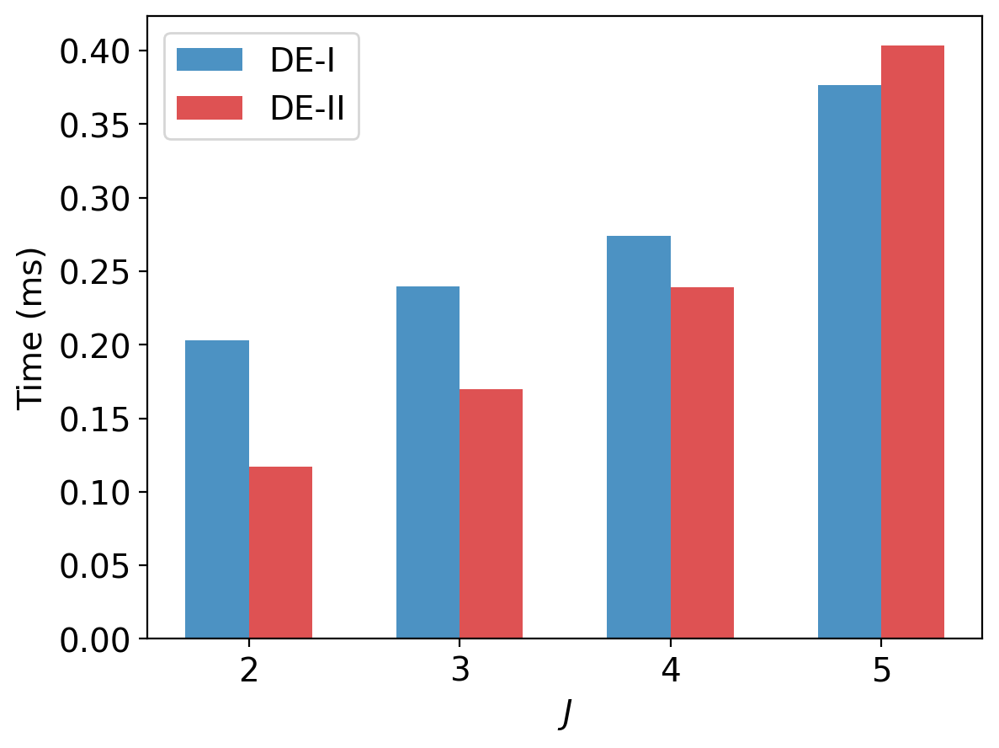

In [19]:
ave_comp_time_ldl = (df_ct_ldl.sum())/3
ave_comp_time_mldl = (df_ct_mldl.sum())/3

print(ave_comp_time_ldl)
print(ave_comp_time_mldl)
plt.rcParams["font.size"] = 14 

fig, ax = plt.subplots(dpi=200) 
J = [2, 3, 4, 5]
ax.bar(J, ave_comp_time_ldl, align="edge", width=-0.3, color='C0', alpha=0.8, label=f'DE-I')
ax.bar(J, ave_comp_time_mldl, align="edge", width=0.3, color='C3', alpha=0.8, label=f'DE-II')
ax.set_xlabel('$J$')
ax.set_ylabel('Time (ms)')
ax.legend()
ax.set_xticks(J, J)
plt.savefig('Average computational time.pdf')

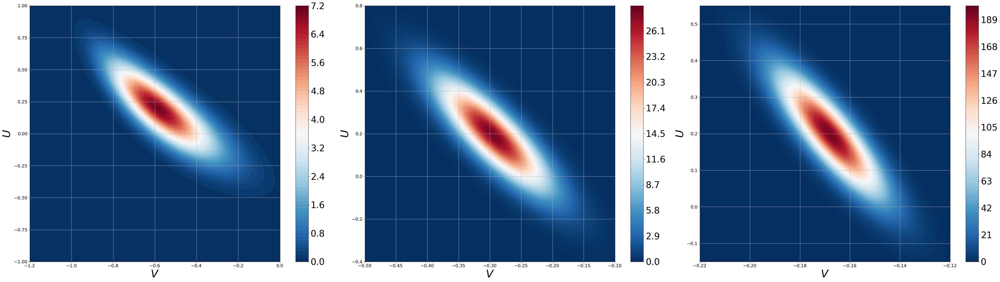

In [13]:
density_levels = {
    '0.1': np.arange(int(7.2/0.1)+1)*0.1,
    '0.05': np.arange(int(29/0.05))*0.05,
    '0.02': np.arange(int(200/1)+1)*1
}

 
fig, axe = plt.subplots(1, 3, squeeze=False, tight_layout=True, figsize=(45,13))
plt.rcParams["font.size"] = 28

for t_max, ncol in [
    (0.1, 0),
    (0.05, 1),
    (0.02, 2)
]:
    df = pd.read_csv(benchmark_path[f'{t_max}'], header=None)
    benchmark = df.to_numpy() 
    (s_min, s_max) = s_range[f'{t_max}'] 
    (r_min, r_max) = r_range[f'{t_max}'] 
    smooth_grid = np.linspace(s_min, s_max, 51)
    rough_grid = np.linspace(r_min, r_max, 51) 
    xx, yy = np.meshgrid(rough_grid, smooth_grid) 
    
    grids = jnp.array([[[rough_grid[i], smooth_grid[j]] for i in range(rough_grid.size)] for j in range(smooth_grid.size)])
    ax = axe[0, ncol]
    mappable = ax.contourf(yy, xx, benchmark, cmap='RdBu_r', levels = density_levels[f'{t_max}'])
    plt.colorbar(mappable, ax=ax)
    ax.grid(True)
    # plt.grid(True) 
    ax.set_xlabel('$V$', fontsize=34)
    ax.set_ylabel('$U$', fontsize=34)

plt.savefig(f'Contour-density-target-set2.pdf')
plt.show()

In [14]:
err_levels = {
    '0.1': np.arange(int(2.5/0.1)+1)*0.1,
    '0.05': np.arange(int(2/0.1))*0.1,
    '0.02': np.arange(int(3/0.1)+1)*0.1
}

t_max_item ={
    '0.1': 0,
    '0.05': 1,
    '0.02': 2
}

plt.rcParams["font.size"] = 28 

for type, est_grids in [
    ('DE-I', est_grids_ldl),
    ('DE-II', est_grids_mldl)
    ]:
    fig, axes = plt.subplots(3, 4, squeeze=False, tight_layout=True, figsize=(50,30), dpi=500)
    
    print(type)
    for key, nrow in t_max_item.items():
        (s_min, s_max) = s_range[f'{key}'] 
        (r_min, r_max) = r_range[f'{key}'] 
        smooth_grid = np.linspace(s_min, s_max, 51)
        rough_grid = np.linspace(r_min, r_max, 51)
        xx, yy = np.meshgrid(rough_grid, smooth_grid) 
        # fig, axes = plt.subplots(1, 4, squeeze=False, tight_layout=True, figsize=(50,10))

        for i in range(4):
            ax = axes[nrow, i]
            mappable = ax.contourf(yy, xx, est_grids[key][i], cmap='jet', levels = err_levels[key])
            plt.colorbar(mappable, ax=ax)
            # ax.grid(True)
            # plt.grid(True) 
            ax.set_title(f'$(\Delta, J)  = ({key} ,{i+2})$', fontsize = 36) 
            ax.set_xlabel('$V$', fontsize = 28)
            ax.set_ylabel('$U$', fontsize = 28)    
    
    plt.savefig(f'Contour-density-abs-err-{type}-delta-{key}-set2.pdf')
    plt.show()


DE-I


DE-II


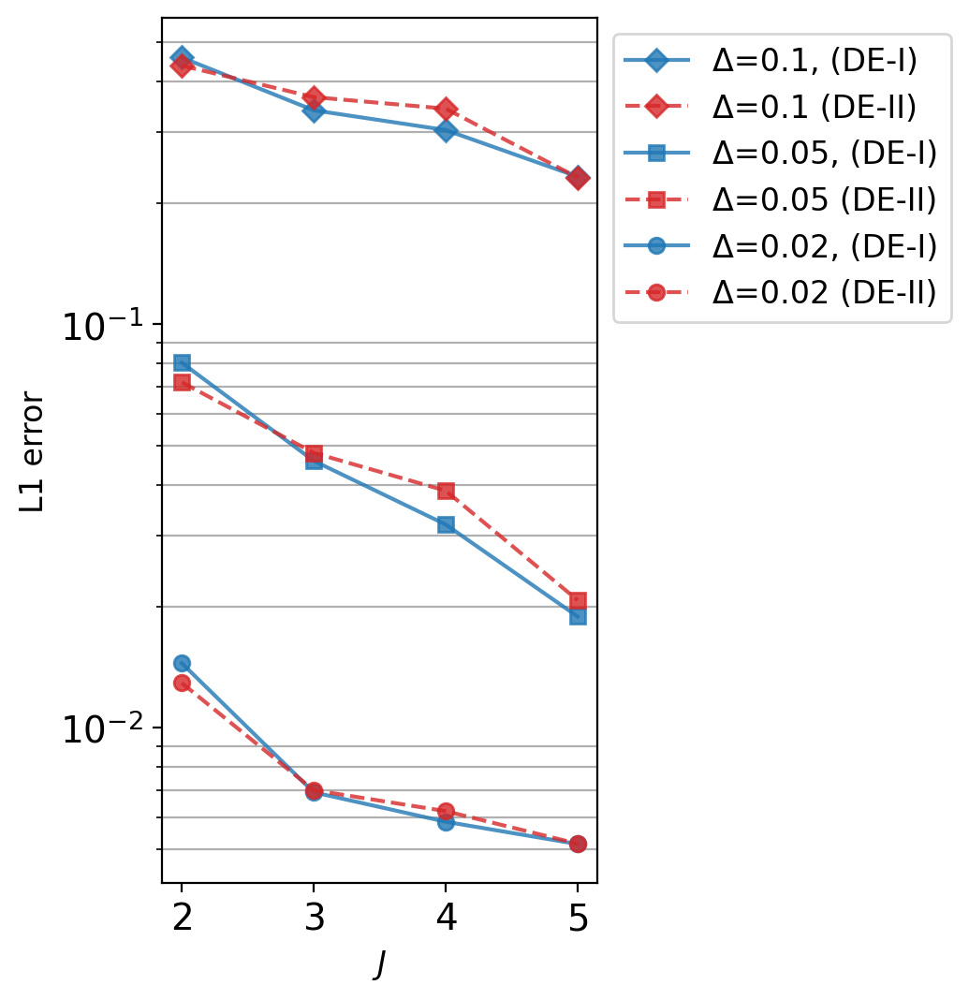

In [15]:
J_seq = ['2', '3', '4', '5']
plt.rcParams["font.size"] = 14  
fig, ax = plt.subplots(sharex=True, figsize=(3, 6), dpi=200) 

for key, marker_ldl, marker_mldl in [
    ("0.1", 'D-', 'D--'),
    ("0.05", 's-', 's--'),
    ("0.02", 'o-', 'o--')
]:
    ax.plot(J_seq, L1_err_DE_LDL[key], marker_ldl, alpha=0.8, color="C0", label=f'Δ={key}, (DE-I)')
    ax.plot(J_seq, L1_err_DE_mLDL[key], marker_mldl, alpha=0.8, color="C3",  label=f'Δ={key} (DE-II)')
    

ax.set_xlabel('$J$', fontsize=12)
ax.set_ylabel('L1 error', fontsize=12) 
# ax.minorticks_on(axis='y')
ax.grid(axis='y', which='minor')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=12)
plt.yscale('log')   
fig.savefig(f"L1_error_paramset2.pdf", bbox_inches='tight')
plt.show() 
